# 1. Import libraries

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
plt.style.use('ggplot')
import seaborn as sns
import folium
import folium.plugins as plugins
from folium.features import ClickForMarker
from folium.plugins import HeatMap
from branca.element import Template, MacroElement
from random import sample 

# 2. Import the dataset

In [2]:
df = pd.read_csv('./ny_clean_data.csv')
df.info()
df.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6919629 entries, 0 to 6919628
Data columns (total 18 columns):
 #   Column             Dtype  
---  ------             -----  
 0   ADDR_PCT_CD        float64
 1   CRM_ATPT_CPTD_CD   int64  
 2   CRIME_CLASS        object 
 3   BORO_NM            object 
 4   PREM_TYP_DESC      object 
 5   IN_PARK            int64  
 6   IN_PUBLIC_HOUSING  int64  
 7   Latitude           float64
 8   Longitude          float64
 9   IN_STATION         int64  
 10  VIC_AGE_GROUP      object 
 11  VIC_RACE           object 
 12  VIC_SEX            object 
 13  year               int64  
 14  month              int64  
 15  day                int64  
 16  hour               int64  
 17  weekday            object 
dtypes: float64(3), int64(8), object(7)
memory usage: 950.3+ MB


,ADDR_PCT_CD,CRM_ATPT_CPTD_CD,CRIME_CLASS,BORO_NM,PREM_TYP_DESC,IN_PARK,IN_PUBLIC_HOUSING,Latitude,Longitude,IN_STATION,VIC_AGE_GROUP,VIC_RACE,VIC_SEX,year,month,day,hour,weekday
0,81.0,0,MISDEMEANOR,BROOKLYN,STREET,0,0,40.685041,-73.921777,0,25-44,WHITE,F,2014,9,4,17,Thursday
1,121.0,0,FELONY,STATEN ISLAND,STREET,0,0,40.636991,-74.134093,0,45-64,WHITE HISPANIC,F,2016,10,12,7,Wednesday
2,41.0,0,FELONY,BRONX,STREET,0,0,40.823876,-73.891863,0,45-64,WHITE HISPANIC,F,2012,9,28,13,Friday
3,46.0,0,MISDEMEANOR,BRONX,STREET,0,0,40.845707,-73.910398,0,<18,WHITE HISPANIC,F,2015,3,24,15,Tuesday
4,109.0,0,MISDEMEANOR,QUEENS,STREET,0,0,40.763992,-73.828426,0,25-44,BLACK,M,2017,5,20,4,Saturday


In [3]:
df.shape

(6919629, 18)

In [4]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
ADDR_PCT_CD,6919629.0,63.311491,34.507060,-99.000000,40.000000,63.000000,94.000000,123.000000
CRM_ATPT_CPTD_CD,6919629.0,0.017141,0.129797,0.000000,0.000000,0.000000,0.000000,1.000000
IN_PARK,6919629.0,0.003613,0.059996,0.000000,0.000000,0.000000,0.000000,1.000000
IN_PUBLIC_HOUSING,6919629.0,0.049653,0.217228,0.000000,0.000000,0.000000,0.000000,1.000000
Latitude,6919629.0,40.734871,0.086515,40.112710,40.672538,40.731819,40.812116,59.657274
Longitude,6919629.0,-73.925806,0.078461,-77.519206,-73.973166,-73.927289,-73.883187,-73.684788
IN_STATION,6919629.0,0.022429,0.148074,0.000000,0.000000,0.000000,0.000000,1.000000
year,6919629.0,2012.303676,4.067072,1900.000000,2009.000000,2012.000000,2016.000000,2019.000000
month,6919629.0,6.565711,3.385830,1.000000,4.000000,7.000000,9.000000,12.000000
day,6919629.0,15.531187,8.849797,1.000000,8.000000,15.000000,23.000000,31.000000


In [5]:
df.head()

,ADDR_PCT_CD,CRM_ATPT_CPTD_CD,CRIME_CLASS,BORO_NM,PREM_TYP_DESC,IN_PARK,IN_PUBLIC_HOUSING,Latitude,Longitude,IN_STATION,VIC_AGE_GROUP,VIC_RACE,VIC_SEX,year,month,day,hour,weekday
0,81.0,0,MISDEMEANOR,BROOKLYN,STREET,0,0,40.685041,-73.921777,0,25-44,WHITE,F,2014,9,4,17,Thursday
1,121.0,0,FELONY,STATEN ISLAND,STREET,0,0,40.636991,-74.134093,0,45-64,WHITE HISPANIC,F,2016,10,12,7,Wednesday
2,41.0,0,FELONY,BRONX,STREET,0,0,40.823876,-73.891863,0,45-64,WHITE HISPANIC,F,2012,9,28,13,Friday
3,46.0,0,MISDEMEANOR,BRONX,STREET,0,0,40.845707,-73.910398,0,<18,WHITE HISPANIC,F,2015,3,24,15,Tuesday
4,109.0,0,MISDEMEANOR,QUEENS,STREET,0,0,40.763992,-73.828426,0,25-44,BLACK,M,2017,5,20,4,Saturday


# 3. Data Visualisation

## 3.1 Crime classes

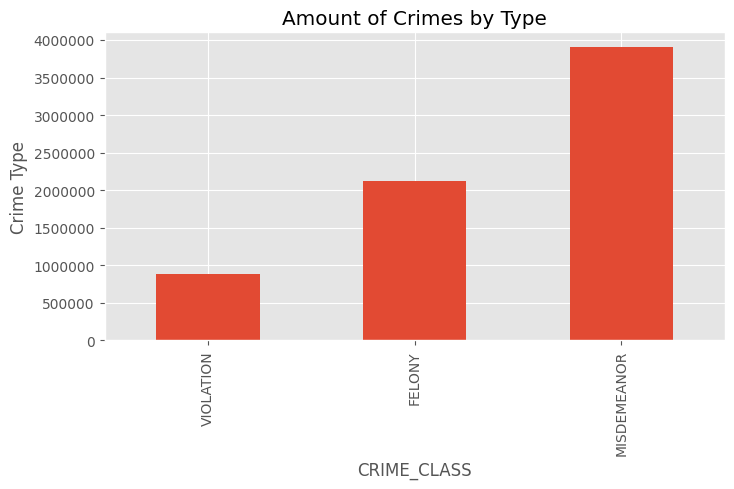

In [6]:
plt.figure(figsize=(8,4))
plt.title('Amount of Crimes by Type')
plt.ticklabel_format(style='plain', axis='y')
plt.ylabel('Crime Type')
plt.xlabel('Amount of Crimes')
df.groupby([df['CRIME_CLASS']]).size().sort_values().plot(kind='bar')
plt.show()

## 3.2 Victims

In [7]:
victim = df[['VIC_SEX', 'VIC_RACE', 'VIC_AGE_GROUP']]

### Age

Text(0.5, 1.0, 'Victim distribution by age')

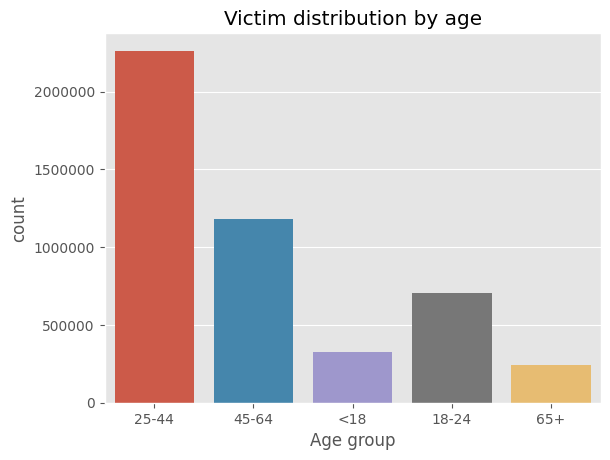

In [8]:
x = victim[(victim['VIC_AGE_GROUP'] !='UNKNOWN')]
sns.countplot(x=x['VIC_AGE_GROUP'])
plt.ticklabel_format(style='plain', axis='y')
plt.xlabel('Age group')
plt.ylabel('count')
plt.title('Victim distribution by age')

### Sex

Text(0.5, 1.0, 'Victim distribution by sex')

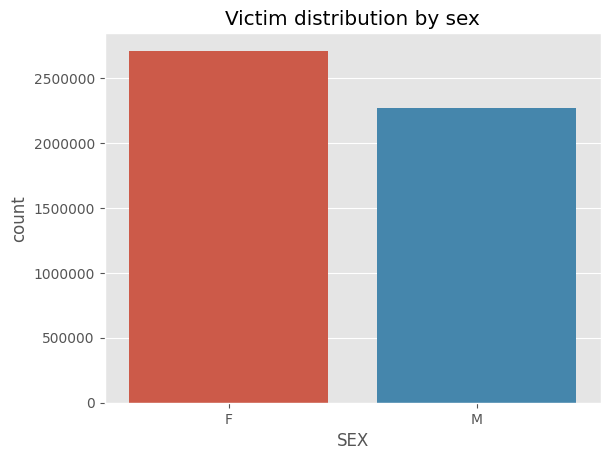

In [9]:
x = victim[(victim['VIC_SEX']=='M') | (victim['VIC_SEX']=='F')]
sns.countplot(x=x['VIC_SEX'])
plt.ticklabel_format(style='plain', axis='y')
plt.xlabel('SEX')
plt.ylabel('count')
plt.title('Victim distribution by sex')

### Race

Text(0.5, 1.0, 'Victim distribution by race')

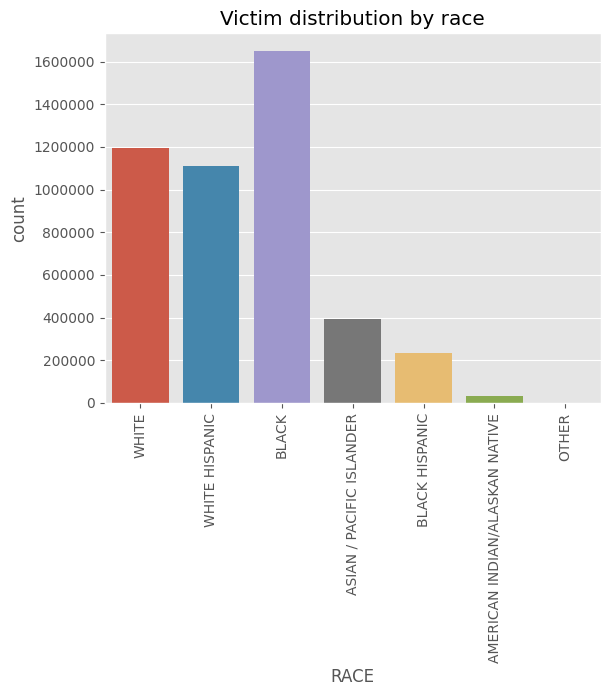

In [10]:
x = victim[(victim['VIC_RACE']!='UNKNOWN')]
sns.countplot(x=x['VIC_RACE'])
plt.ticklabel_format(style='plain', axis='y')
plt.xlabel('RACE')
plt.ylabel('count')
plt.xticks(rotation=90)
plt.title('Victim distribution by race')

### Relation between age and sex

Text(0.5, 1.0, 'Victim aged between 25-44 distribution by sex')

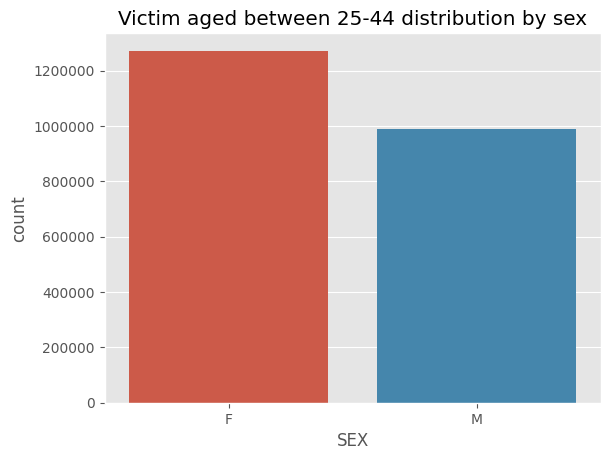

In [11]:
x = victim[(victim['VIC_AGE_GROUP'] == "25-44")]
x = x[(x['VIC_SEX']=='M') | (x['VIC_SEX']=='F')]
sns.countplot(x=x['VIC_SEX'])
plt.ticklabel_format(style='plain', axis='y')
plt.xlabel('SEX')
plt.ylabel('count')
plt.title('Victim aged between 25-44 distribution by sex')

### Relation between race and sex

Text(0.5, 1.0, 'Black Victim distribution by sex')

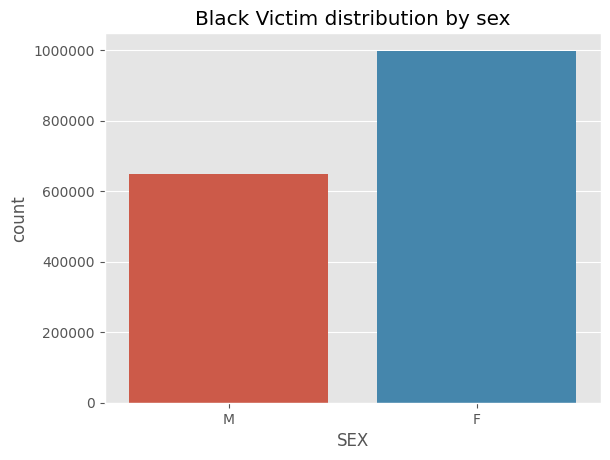

In [12]:
x = victim[(victim['VIC_RACE'] == "BLACK")]
x = x[(x['VIC_SEX']=='M') | (x['VIC_SEX']=='F')]
sns.countplot(x=x['VIC_SEX'])
plt.ticklabel_format(style='plain', axis='y')
plt.xlabel('SEX')
plt.ylabel('count')
plt.title('Black Victim distribution by sex')

## 3.3 Crime Zones

In [13]:
area = df[['BORO_NM', 'ADDR_PCT_CD', 'Latitude', 'Longitude']]

<AxesSubplot: title={'center': 'Number of Crimes in Different Borough'}, xlabel='BORO_NM', ylabel='count'>

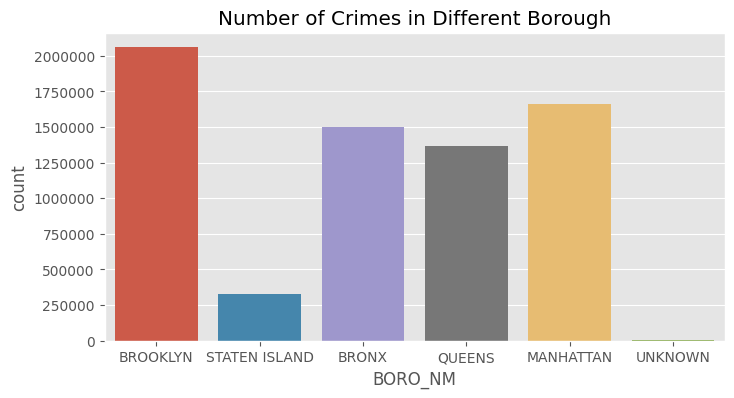

In [14]:
plt.figure(figsize=(8,4))
plt.ticklabel_format(style='plain', axis='y')
plt.title('Number of Crimes in Different Borough')
plt.xlabel('Borough')
plt.ylabel('count')
sns.countplot(x=area['BORO_NM'])

In [17]:
positions = list(zip(area['Latitude'], area['Longitude']))
tiles = 'Stamen Terrain'
#40.685041	-73.921777
fol = folium.Map(location=[40.68,-73.92], zoom_start=10, tiles = tiles)
pos_samp = sample(positions, 22000)#22K is the max now as we join both DS togather 
HeatMap(pos_samp, radius = 8).add_to(fol) 
fol

In [33]:
len(df[(df.year==2019)])

449191

In [34]:
m = folium.Map(location = [40.75, -73.85], tiles = 'cartodbpositron', zoom_start = 11.25)

to_plot = df[(df.year==2019)].sample(20000)

for i in range(0, len(to_plot)):
    if to_plot.iloc[i].CRIME_CLASS == 'VIOLATION':
        c = 'blue'
    elif to_plot.iloc[i].CRIME_CLASS == 'MISDEMEANOR':
        c = 'orange'
    else:
        c = 'red'
    
    folium.Circle(location = [to_plot.iloc[i].Latitude ,
                              to_plot.iloc[i].Longitude],
                  radius = 150,
                  color = c,
                  fill = True,
                  stroke = True,
                  fillOpacity = 0.2
   ).add_to(m)
mapWidth, mapHeight = (400, 500)
m

## 3.4 Datetime

### Per year

<AxesSubplot: xlabel='year', ylabel='count'>

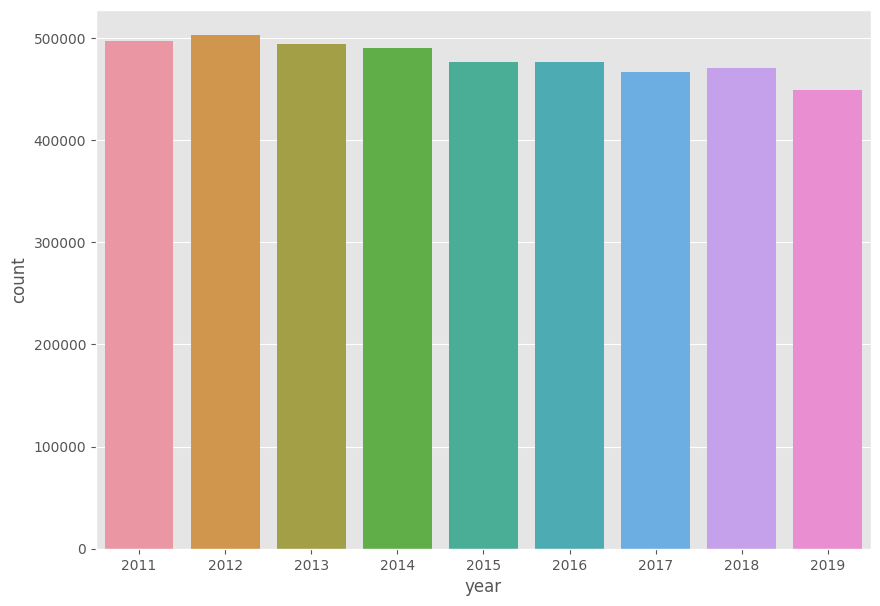

In [32]:
f, ax = plt.subplots(figsize=(10, 7))
data = df[(df.year>2010)]
sns.countplot(x="year", data=data)

### Per month

<AxesSubplot: xlabel='month', ylabel='count'>

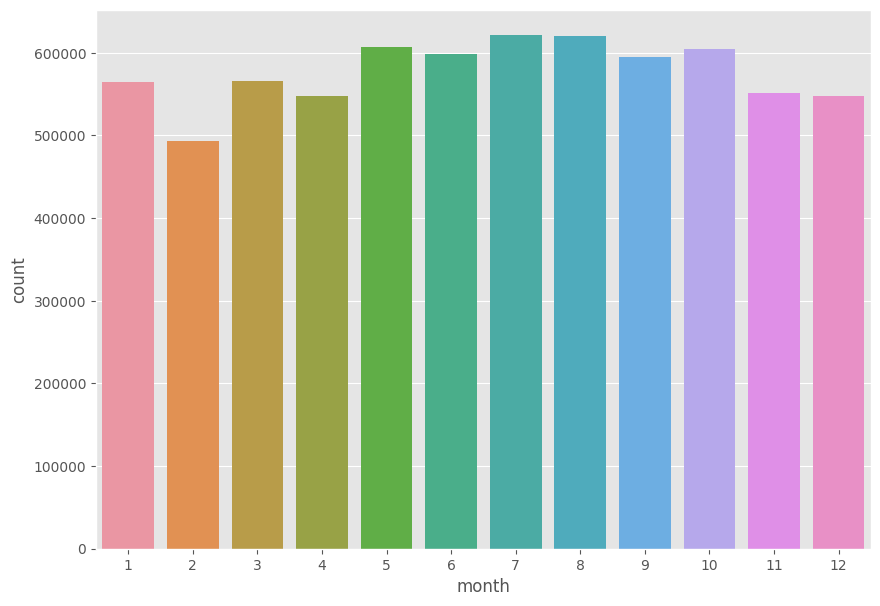

In [26]:
f, ax = plt.subplots(figsize=(10, 7))
sns.countplot(x="month", data=df)

### Per weekday

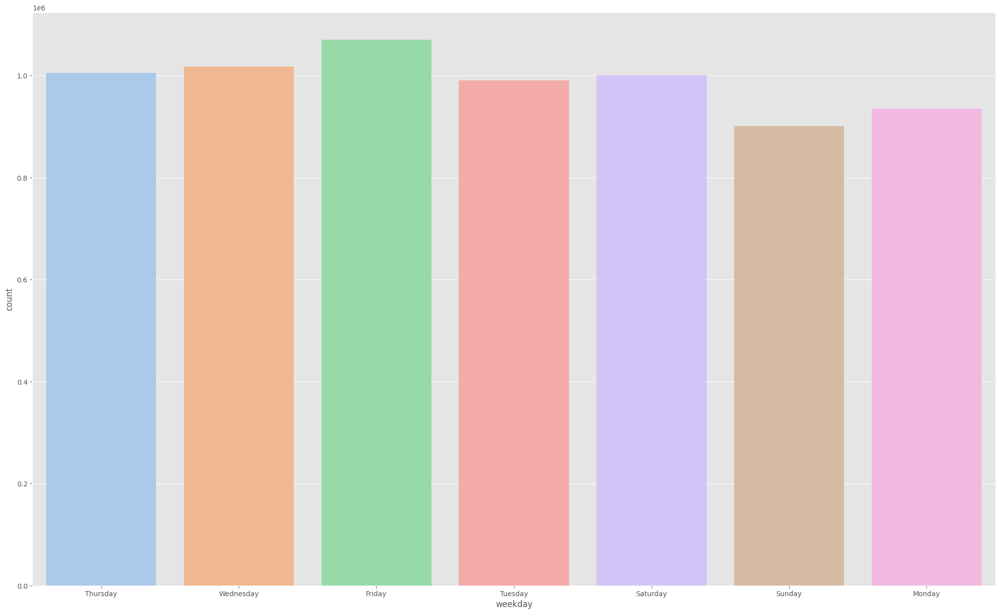

In [25]:
f, ax = plt.subplots(figsize=(25, 15))
sns.countplot(x="weekday", data=df, palette="pastel");

### per hour

<AxesSubplot: xlabel='count', ylabel='hour'>

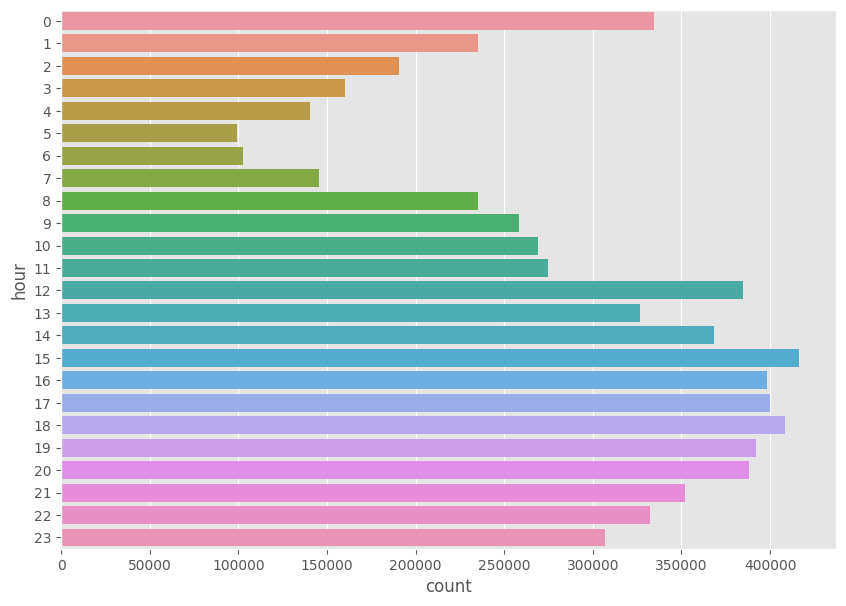

In [35]:
f, ax = plt.subplots(figsize=(10, 7))
sns.countplot(y="hour", data=df)